<a href="https://colab.research.google.com/github/PrathamBorkar/Carconnect7/blob/main/dogvision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
try:
  %tensorflow_version 2.x
except Exception:
  pass

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [2]:
import tensorflow as tf

In [3]:
import tensorflow_hub as hub


In [4]:
print(tf.config.list_physical_devices())

print("GPU","available  " if tf.config.list_physical_devices("GPU") else "not")


[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU available  


GEtting data ready
turningimages into numerical format(tensess)

In [5]:
turning images into tenses ie numerical reprenstation


SyntaxError: invalid syntax (<ipython-input-5-3623fe8adca0>, line 1)

In [6]:
#check out lables

import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/Dogvision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

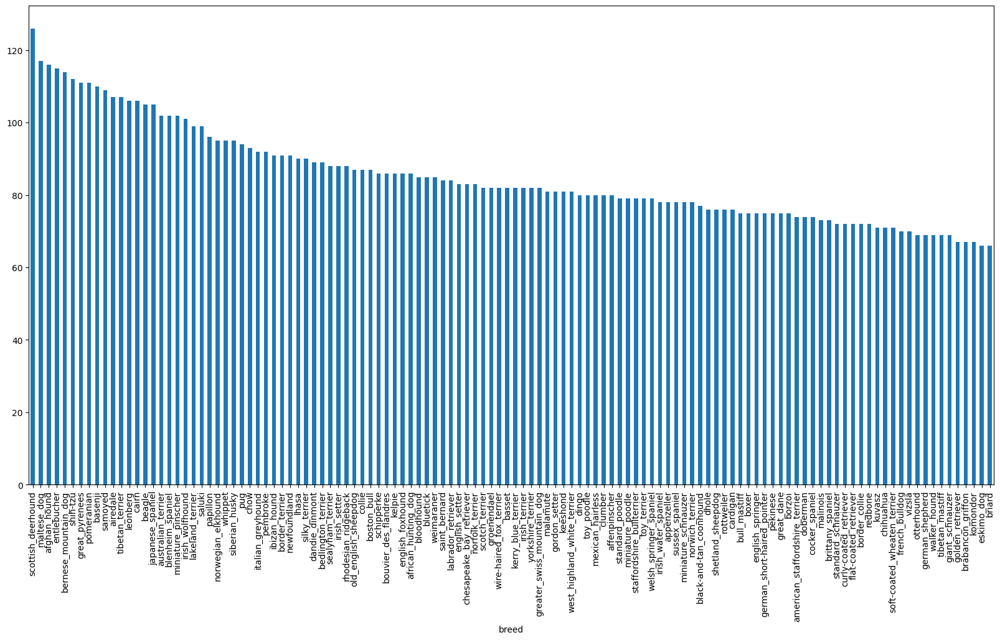

In [8]:
#how many images of each breedd
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [9]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

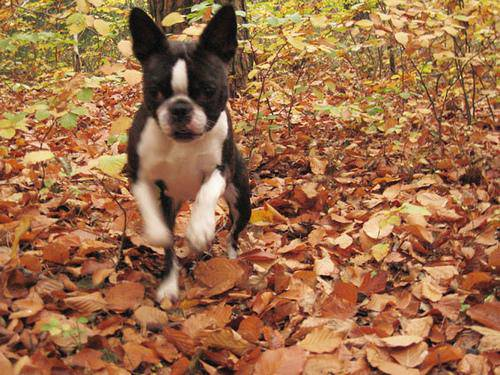

In [10]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dogvision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [11]:
#create pathname from image ids
filename=["/content/drive/MyDrive/Dogvision/train/"+fname for fname in labels_csv["id"]+".jpg"]
len(filename)


10222

In [12]:
import os
if len(os.listdir("/content/drive/MyDrive/Dogvision/train"))==len(filename):
  print("yes")
else :
  print("NO")

NO


In [13]:
labels=labels_csv["breed"].to_numpy()
labels
len(labels)

10222

In [14]:
if len(labels)==len(filename):
  print("yes")
else:
  print("no")

yes


In [15]:
unique_breeds=pd.unique(labels)
len(unique_breeds)

120

In [16]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [17]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
brabancon_griffon,67
komondor,67


In [18]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [19]:
labels=labels_csv["breed"].to_numpy()

In [20]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [21]:
len(labels)

10222

In [22]:
#check if no of labels matches fileme=nem

In [23]:
if(len(labels)==len(filename)):
  print("yes")
else:
  print("no")

yes


In [24]:
#converting string to numbers find the unique labels values

In [25]:
import numpy as np
unique_breeds=np.unique(labels)
len(unique_breeds)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [26]:
#turn single lable in arry of booleans
print(labels[0])
labels[0]==unique_breeds


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [27]:
boolean_labels=[label==np.array(unique_breeds) for label in labels]
boolean_labels[:10]
len(boolean_labels)

10222

In [28]:
#turning boolean labels intp integers
print(labels[0])
print(np.where(unique_breeds==labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [29]:
print(labels[2])
print(boolean_labels[2].argmax())
print(boolean_labels[2].astype(int))

pekinese
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [30]:
filename[:10]

['/content/drive/MyDrive/Dogvision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dogvision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dogvision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dogvision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dogvision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dogvision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dogvision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dogvision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dogvision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dogvision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [31]:
x=filename
y=boolean_labels


In [32]:
NUM_IMAGES =1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [33]:
#split data

In [34]:
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [35]:
##turning images into tensor

read filepath and sve i

# > Add blockquote



array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
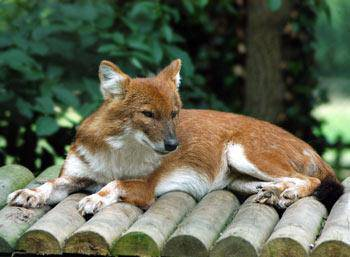

In [36]:
from matplotlib.pyplot import imread
image=imread(filename[42])
image.shape
image


array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
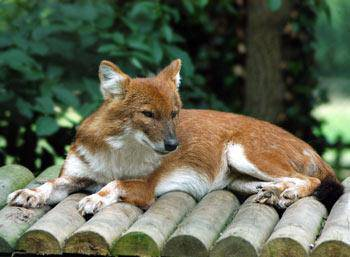

In [37]:
import numpy as np
np.array(image).max()
np.array(image)

In [38]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [39]:
IMG_SIZE=224
#preprocessing images:

def process_image(image_path):
  image=tf.io.read_file(image_path)
  image=tf.image.decode_jpeg(image,channels=3)
  image=tf.image.convert_image_dtype(image,tf.float32)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

In [40]:
#tensorflow we need to data in form of tensor (image ,labels)

In [41]:
import tensorflow as tf

def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label



In [42]:
process_image(x[42])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [43]:
#turn our data into tensors

In [44]:
BATCH_SIZE=32
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  if test_data:
    print("creating test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch #This line ensures the function returns a value in this branch

  elif valid_data:
    print("creating validation data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch #This line ensures the function returns a value in this branch

  else :
    print("creating training data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data=data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)
    return data_batch #This line ensures the function returns a value in this branch

In [45]:
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

creating training data batches
creating validation data batches


In [46]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [47]:
import matplotlib.pyplot as plt
def show_25_images(images,labels):
  display_images=images[:25]
  display_labels=labels[:25]
  fig,axes=plt.subplots(5,5,figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(display_images[i])
    plt.title(unique_breeds[display_labels[i].argmax()])
    plt.axis("off")

In [48]:
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

creating training data batches
creating validation data batches


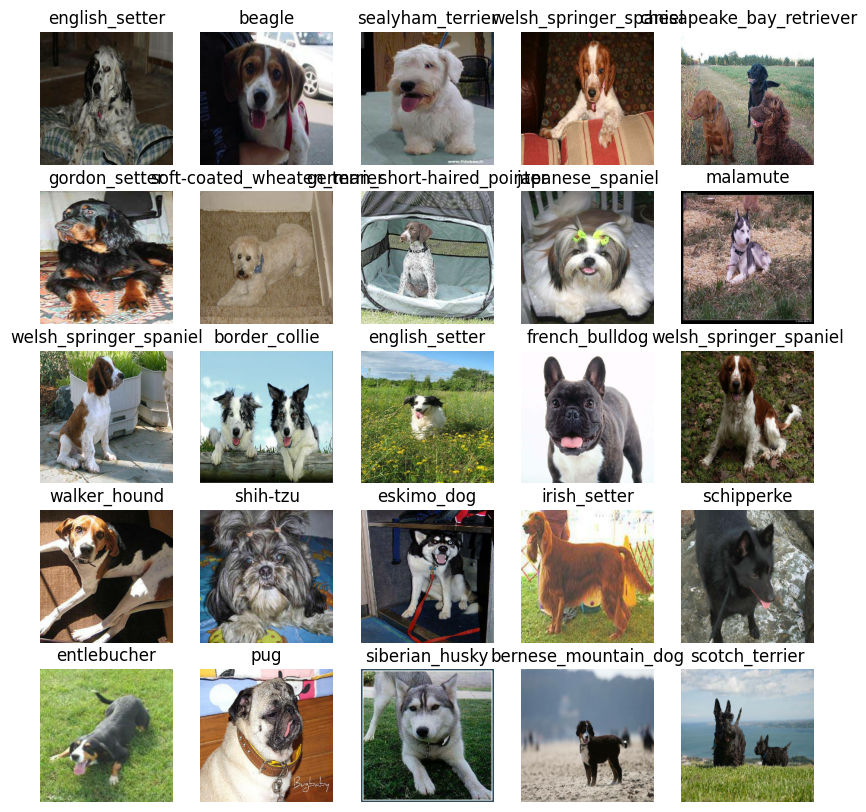

In [49]:
# Make sure to run Cell 58 or Cell 3 before running this cell (Cell 4).
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

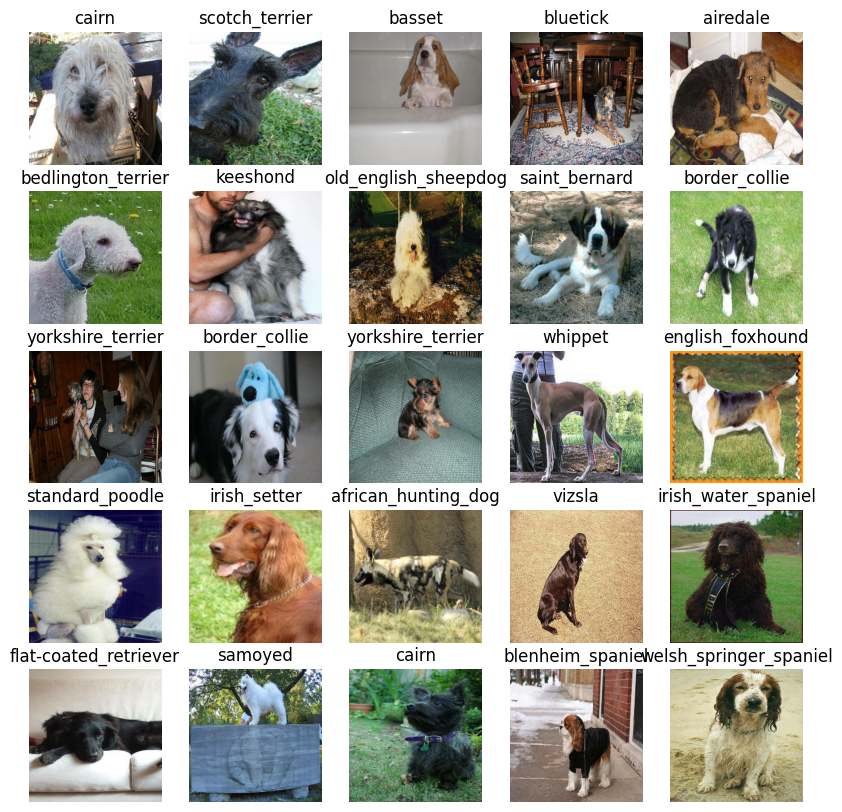

In [50]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

In [51]:
IMG_SIZE


224

In [52]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE=len(unique_breeds)
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


In [53]:
!pip install --upgrade tensorflow tensorflow_hub  # Ensure you have latest versions
import tensorflow as tf
import tensorflow_hub as hub

IMG_SIZE = 224
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
OUTPUT_SHAPE = len(unique_breeds) # Replace with the number of unique classes
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Define the Sequential model
    model = tf.keras.Sequential([
        # Wrap the KerasLayer in a Lambda layer if necessary
        tf.keras.layers.Lambda(lambda x: hub.KerasLayer(model_url, trainable=False)(x), input_shape=input_shape),
        tf.keras.layers.Dense(units=output_shape, activation="softmax")  # Add classification head
    ])

    # Compile the model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model

# Create and summarize the model
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/lambda_layer.py:65: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

In [54]:
#creating callback
#tensorboad
%load_ext tensorboard

In [55]:
import datetime
def create_tensorboard_callback():
  log_dir=os.path.join("drive/MyDrive/Dogvision/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir=log_dir)

In [56]:
#preventing overfitting

early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

In [57]:
#tarining 1000 images

NUM_EPOCHS=100 #@param {type:"slider",min:10,max:100}

In [58]:
#fun to train

def train_model():
  model=create_model()
  tensorboard=create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [59]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 42s 674ms/step - accuracy: 0.0383 - loss: 5.1148 - val_accuracy: 0.2750 - val_loss: 3.3880
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - accuracy: 0.6494 - loss: 1.9017 - val_accuracy: 0.4800 - val_loss: 2.1718
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 172ms/step - accuracy: 0.9420 - loss: 0.5994 - val_accuracy: 0.5500 - val_loss: 1.7295
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.9771 - loss: 0.2704 - val_accuracy: 0.6200 - val_loss: 1.5330
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - accuracy: 0.9983 - loss: 0.1598 - val_accuracy: 0.6550 - val_loss: 1.4536
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 189ms/step - accuracy: 1.0000 - loss: 0.1063 - val_accuracy: 0.6700 - val_loss: 1.3967
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - accuracy: 1.0000 - loss: 0.0739 - val_accuracy: 0.6700 - val_loss: 1.3687
Ep

In [60]:
%tensorboard --logdir drive/MyDrive/Dogvision/logs

<IPython.core.display.Javascript object>

In [61]:
#make predictions
predictions=model.predict(val_data,verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step


array([[1.6816611e-03, 1.2483948e-04, 6.5975438e-04, ..., 1.4977845e-03,
        5.7376812e-05, 3.9603347e-03],
       [2.0853719e-03, 4.2534465e-04, 4.2660823e-03, ..., 9.0090168e-04,
        4.1961214e-03, 5.6006607e-05],
       [1.6564416e-03, 4.3421186e-04, 1.6881378e-03, ..., 5.6365627e-04,
        1.7753575e-04, 1.8436003e-03],
       ...,
       [7.7801333e-06, 5.0125603e-04, 5.3441053e-04, ..., 2.1269894e-05,
        2.9962295e-04, 1.0655078e-03],
       [7.0599276e-03, 5.0384289e-04, 3.9365771e-04, ..., 9.8849752e-04,
        1.2499260e-04, 7.0190169e-03],
       [3.7777761e-04, 6.6672997e-06, 2.0334002e-04, ..., 1.3574566e-03,
        1.9962643e-03, 2.6461103e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [62]:
np.sum(predictions[1])

1.0

In [63]:
print(f"max value(probability of pred):{np.max(predictions[0])}")
print(f"max value(probability of pred):{np.max(predictions[1])}")

max value(probability of pred):0.28413230180740356
max value(probability of pred):0.7153066992759705


In [64]:
index=12
print(f"max value(probability of pred):{np.max(predictions[index])}")
print(f"max value(probability of pred):{np.argmax(predictions[index])}")
print(f"sum:{np.sum(predictions[index])}")
print(f"class name:{unique_breeds[np.argmax(predictions[index])]}")

max value(probability of pred):0.29027411341667175
max value(probability of pred):6
sum:0.9999999403953552
class name:australian_terrier


In [65]:
unique_breeds[12]

'black-and-tan_coonhound'

In [66]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]
pred_labels=get_pred_label(predictions[81])
pred_labels

'dingo'

In [67]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [82]:
def ubatchify(data):
  images=[]
  labelss=[]
  for image,labels in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(labels)
  return images,labels # Corrected indentation

val_images,val_labels=ubatchify(val_data)
#Corrected variable name for val_images
print(val_images[0])

AttributeError: 'numpy.ndarray' object has no attribute 'append'

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


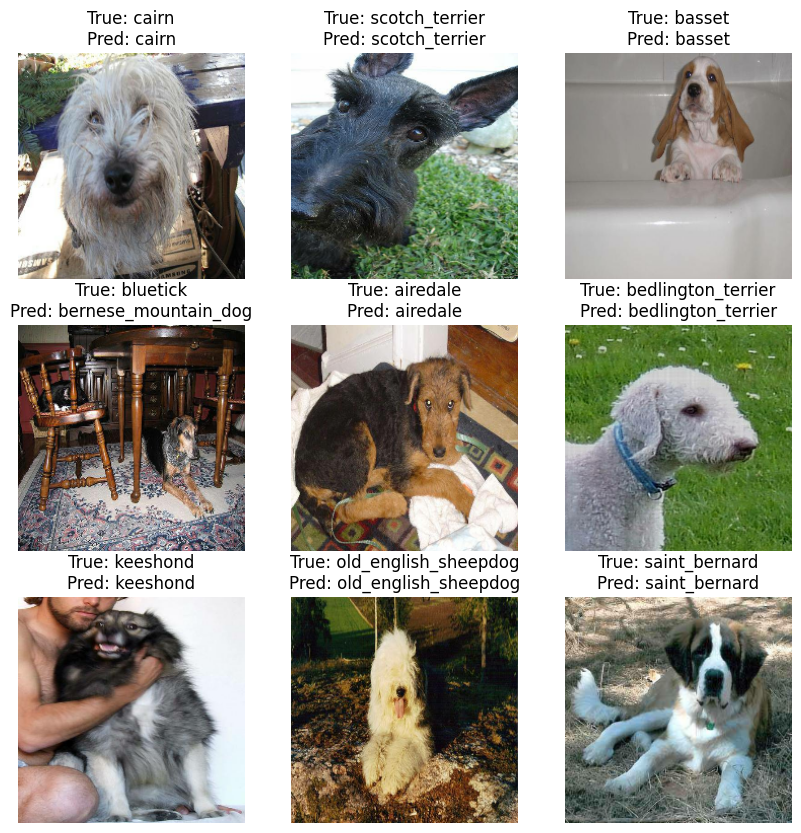

In [70]:
import matplotlib.pyplot as plt

def plot_predictions(images, labels, predictions):
    """Plots images with their true and predicted labels."""
    plt.figure(figsize=(10, 10))
    for i in range(9):  # Plot first 9 images
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        true_label = unique_breeds[labels[i].argmax()]  # Get true label
        pred_label = get_pred_label(predictions[i])  # Get predicted label
        title = f"True: {true_label}\nPred: {pred_label}"
        plt.title(title)
        plt.axis("off")
    plt.show()

# Get a batch of validation data
val_images, val_labels = next(val_data.as_numpy_iterator())

# Make predictions on the batch
batch_predictions = model.predict(val_data.take(1))

# Plot the predictions
plot_predictions(val_images, val_labels, batch_predictions)

7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step


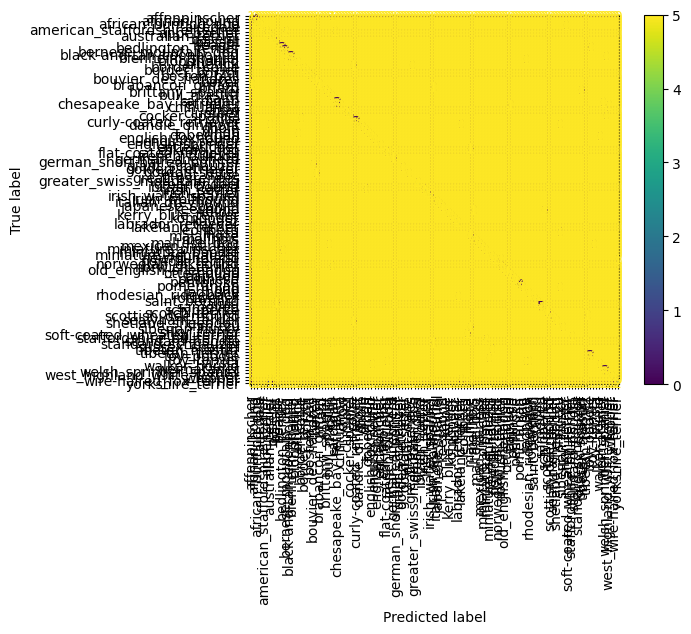

In [73]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get predictions for the entire validation set
val_predictions = model.predict(val_data)
val_pred_labels = [get_pred_label(pred) for pred in val_predictions]

# Get all true labels from the validation set
val_true_labels = []
for images, labels in val_data.unbatch():  # Iterate over individual elements
    val_true_labels.append(unique_breeds[labels.numpy().argmax()])

# Create confusion matrix
cm = confusion_matrix(val_true_labels, val_pred_labels, labels=unique_breeds)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=unique_breeds)
disp.plot(xticks_rotation='vertical')
plt.show()

In [74]:
cm

array([[1, 0, 0, ..., 0, 0, 0],
       [0, 4, 0, ..., 0, 0, 0],
       [0, 0, 2, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 2, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 2]])

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step


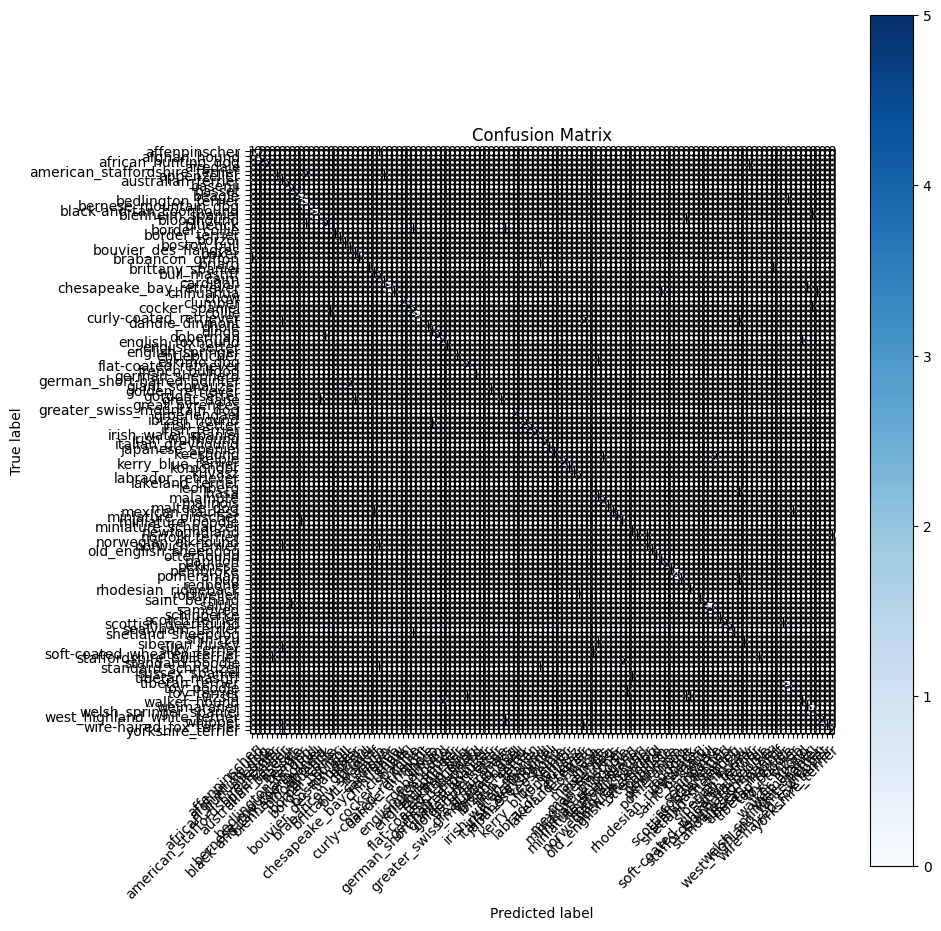

In [75]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Get predictions for the entire validation set
val_predictions = model.predict(val_data)
val_pred_labels = [get_pred_label(pred) for pred in val_predictions]

# Get all true labels from the validation set
val_true_labels = []
for images, labels in val_data.unbatch():  # Iterate over individual elements
    val_true_labels.append(unique_breeds[labels.numpy().argmax()])

# Create confusion matrix
cm = confusion_matrix(val_true_labels, val_pred_labels, labels=unique_breeds)

# Plotting the confusion matrix using matplotlib
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)

# Set tick labels
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       xticklabels=unique_breeds,
       yticklabels=unique_breeds,
       title='Confusion Matrix',
       ylabel='True label',
       xlabel='Predicted label')

# Rotate x-axis tick labels
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
fmt = 'd'  # Format for displaying numbers in the matrix
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

fig.tight_layout()
plt.show()

In [76]:
# Save the entire model to a HDF5 file
model.save('drive/MyDrive/Dogvision/dog_breed_model.h5')

In [79]:
from tensorflow.keras.models import load_model

# Create a new model with the same architecture
loaded_model = create_model()

# Load the weights into the newly created model
loaded_model.load_weights('drive/MyDrive/Dogvision/dog_breed_model.h5')

# Compile the model (if needed)
loaded_model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/lambda_layer.py:65: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


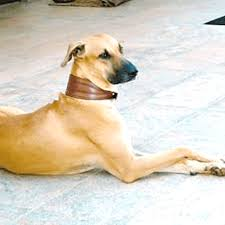

Predicted breed: whippet
7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 308ms/step - accuracy: 0.6905 - loss: 1.2157
Validation Loss: 1.3197098970413208
Validation Accuracy: 0.6700000166893005
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


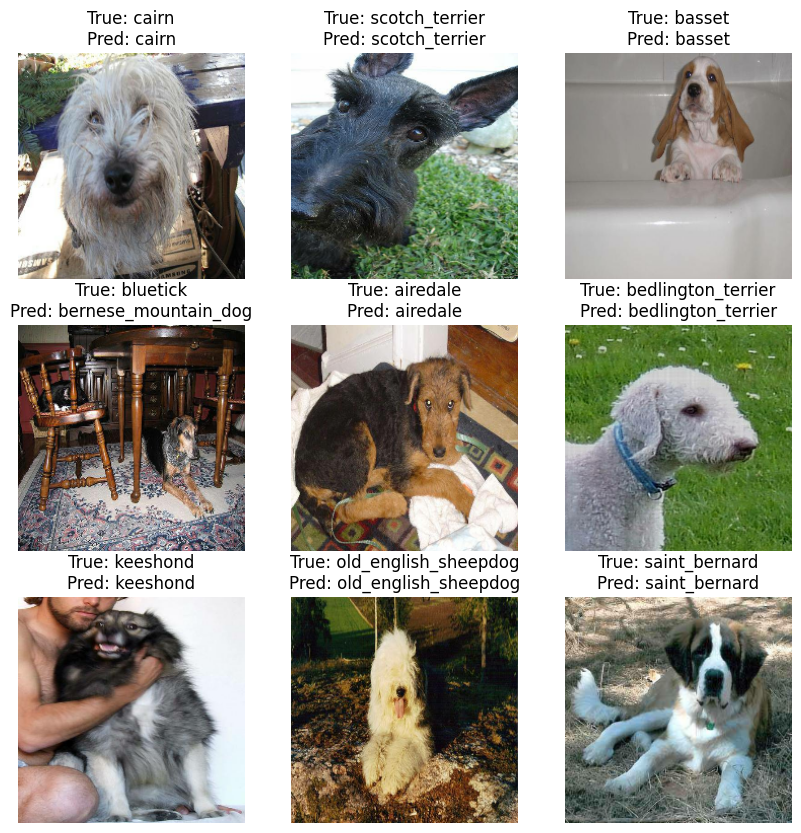

In [80]:
# 1. Predict on a single image:
import numpy as np
from IPython.display import Image

# Load and preprocess a single image (replace with your image path)
image_path = "/content/drive/MyDrive/Dogvision/download (1).jpeg"
image = process_image(image_path)
image = np.expand_dims(image, axis=0)  # Add batch dimension

# Make a prediction
prediction = loaded_model.predict(image)
predicted_label = get_pred_label(prediction[0])

# Display the image and prediction
display(Image(filename=image_path))
print("Predicted breed:", predicted_label)


# 2. Evaluate on the validation data:
loss, accuracy = loaded_model.evaluate(val_data, verbose=1)
print("Validation Loss:", loss)
print("Validation Accuracy:", accuracy)

# 3. Generate predictions and plot a few examples:
import matplotlib.pyplot as plt

val_images, val_labels = next(val_data.as_numpy_iterator())
batch_predictions = loaded_model.predict(val_data.take(1))
plot_predictions(val_images, val_labels, batch_predictions)